# Fraudulent credit card transaction detection using unsupervised learning

## Introduction

It is very important for credit card companies to be able to detect fraudulent credit card transactions so that card holders are not charged for items that they didn't purchase. In this research project, I will implement several unsupervised learning algorithms for clustering the fraudulent and normal credit card transactions using real data from kaggle. 

The original dataset contains transactions made by credit cards in September 2013 by European cardholders, having 492 frauds out of 284,807 transactions. https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud. Due to the computational capacity of personal computer and the imbalance between classes, I randomly selected 3000 normal and all of 492 fraudulent transaction data from this dataset to build my models. 

It contains only numeric, total 31 input variables:
* Time: the seconds elapsed between each transaction and the first transaction in the dataset
* Amount: transaction Amount
* V1, V2, ..., V28: the principal components obtained with PCA (Due to confidentiality issues, the original features and more background information about the data are not provided).
* Class: 1 for fraud and 0 for normal.

The features will be used include 'Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10','V11', 'V12', 'V14', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V23', 'V24', 'V25', 'V27', 'V28', and 'Amount'. They are standardized before fitting into the models. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

The experiment include:
1. Data loading and exploration
2. Dimensionality reduction for visualizing the observations
   * pca
   * t-SNE
   * UMAP
3. Unsupervised algorithms evaluation
   * K-Means
   * Agglomerative
   * DBSCAN
   * Gaussian mixture
4. Clustering
5. Results and discussion

## 1. Data loading and exploration
### 1.1 Data loading

In [1]:
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn import datasets, metrics
import umap

In [2]:
df = pd.read_csv('creditcard.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [4]:
df_1 = df[df.Class==1]
df_0 = df[df.Class==0]

In [5]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 492 entries, 541 to 281674
Data columns (total 31 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    492 non-null    float64
 1   V1      492 non-null    float64
 2   V2      492 non-null    float64
 3   V3      492 non-null    float64
 4   V4      492 non-null    float64
 5   V5      492 non-null    float64
 6   V6      492 non-null    float64
 7   V7      492 non-null    float64
 8   V8      492 non-null    float64
 9   V9      492 non-null    float64
 10  V10     492 non-null    float64
 11  V11     492 non-null    float64
 12  V12     492 non-null    float64
 13  V13     492 non-null    float64
 14  V14     492 non-null    float64
 15  V15     492 non-null    float64
 16  V16     492 non-null    float64
 17  V17     492 non-null    float64
 18  V18     492 non-null    float64
 19  V19     492 non-null    float64
 20  V20     492 non-null    float64
 21  V21     492 non-null    float64
 2

In [6]:
df_0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 284315 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284315 non-null  float64
 1   V1      284315 non-null  float64
 2   V2      284315 non-null  float64
 3   V3      284315 non-null  float64
 4   V4      284315 non-null  float64
 5   V5      284315 non-null  float64
 6   V6      284315 non-null  float64
 7   V7      284315 non-null  float64
 8   V8      284315 non-null  float64
 9   V9      284315 non-null  float64
 10  V10     284315 non-null  float64
 11  V11     284315 non-null  float64
 12  V12     284315 non-null  float64
 13  V13     284315 non-null  float64
 14  V14     284315 non-null  float64
 15  V15     284315 non-null  float64
 16  V16     284315 non-null  float64
 17  V17     284315 non-null  float64
 18  V18     284315 non-null  float64
 19  V19     284315 non-null  float64
 20  V20     284315 non-null  float64
 21  V21     28

#### Observation: the origianal dataset is too large for personal computer to process with 492 frauds out of 284,807 transactions. I randomly select 3000 normal transactions and all of 492 fraudulent transactions for the following study.

In [7]:
np.random.seed(123)

indices = np.random.choice(284315,3000)

df_0_sub = df_0.iloc[indices]

In [8]:
df_new = pd.concat([df_1, df_0_sub])

In [9]:
df_new.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,...,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000,3492.000000
mean,92919.556415,-0.643787,0.521128,-0.954397,0.663529,-0.442710,-0.183507,-0.781994,0.079840,-0.340198,...,0.115706,-0.001278,-0.003505,-0.005174,0.004664,0.022798,0.018673,0.011041,90.380097,0.140893
std,47708.431015,3.499747,2.469823,3.861509,2.285752,2.603007,1.495125,3.491914,2.775176,1.642040,...,1.658811,0.871260,0.739818,0.593928,0.563985,0.487008,0.633945,0.405537,222.075723,0.347961
min,112.000000,-30.552380,-22.075956,-31.103685,-4.337033,-22.105532,-8.369754,-43.557242,-41.044261,-13.434066,...,-22.797604,-8.887017,-19.254328,-2.028024,-4.781606,-1.388944,-7.263482,-4.987659,0.000000,0.000000
25%,52215.250000,-1.186917,-0.535120,-1.417758,-0.680053,-0.901105,-0.905869,-0.815455,-0.199434,-0.879782,...,-0.224012,-0.541855,-0.178600,-0.367765,-0.331210,-0.319799,-0.071283,-0.052156,4.470000,0.000000
50%,83649.500000,-0.207513,0.201352,-0.063133,0.252405,-0.124784,-0.363525,-0.051032,0.046185,-0.154667,...,0.006952,0.011024,-0.020096,0.037803,0.013457,-0.025238,0.008095,0.015549,20.000000,0.000000
75%,137797.250000,1.256666,1.063173,0.942828,1.214069,0.588062,0.325111,0.492519,0.433419,0.516956,...,0.257572,0.536297,0.148342,0.435361,0.369289,0.299978,0.138881,0.099325,85.900000,0.000000
max,172774.000000,2.383670,22.057729,3.624495,12.114672,20.899238,14.793318,21.290897,20.007208,9.125535,...,27.202839,8.361985,6.146762,1.290840,3.119632,2.745261,4.173387,15.374949,4377.980000,1.000000


In [10]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3492 entries, 541 to 93455
Data columns (total 31 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    3492 non-null   float64
 1   V1      3492 non-null   float64
 2   V2      3492 non-null   float64
 3   V3      3492 non-null   float64
 4   V4      3492 non-null   float64
 5   V5      3492 non-null   float64
 6   V6      3492 non-null   float64
 7   V7      3492 non-null   float64
 8   V8      3492 non-null   float64
 9   V9      3492 non-null   float64
 10  V10     3492 non-null   float64
 11  V11     3492 non-null   float64
 12  V12     3492 non-null   float64
 13  V13     3492 non-null   float64
 14  V14     3492 non-null   float64
 15  V15     3492 non-null   float64
 16  V16     3492 non-null   float64
 17  V17     3492 non-null   float64
 18  V18     3492 non-null   float64
 19  V19     3492 non-null   float64
 20  V20     3492 non-null   float64
 21  V21     3492 non-null   float64
 2

#### Comments: df_new will be used for the following clustering algorithms evaluation. It consists of 3000 normal transactions and 492 fraudulent transactions, having all numeric 31 features.

### 1.2 Data exploration

### Histogram of features

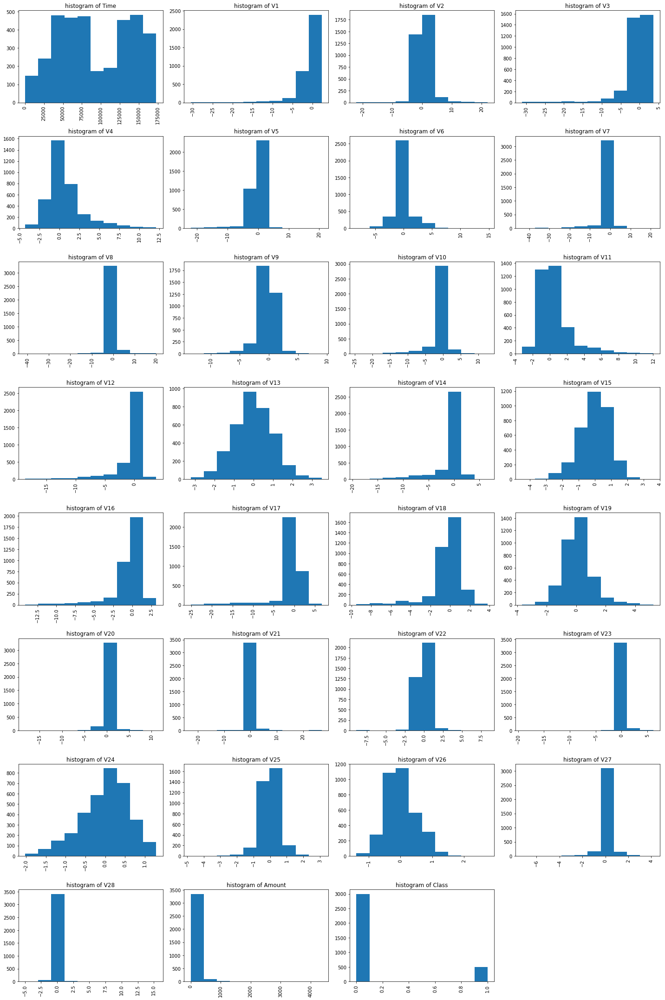

In [11]:
plt.figure(figsize=(20,30))
for i, column in enumerate(df_new.columns):
    plt.subplot(8,4,i+1)
    plt.hist(df_new[column])
    plt.title('histogram of {}'.format(column))
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

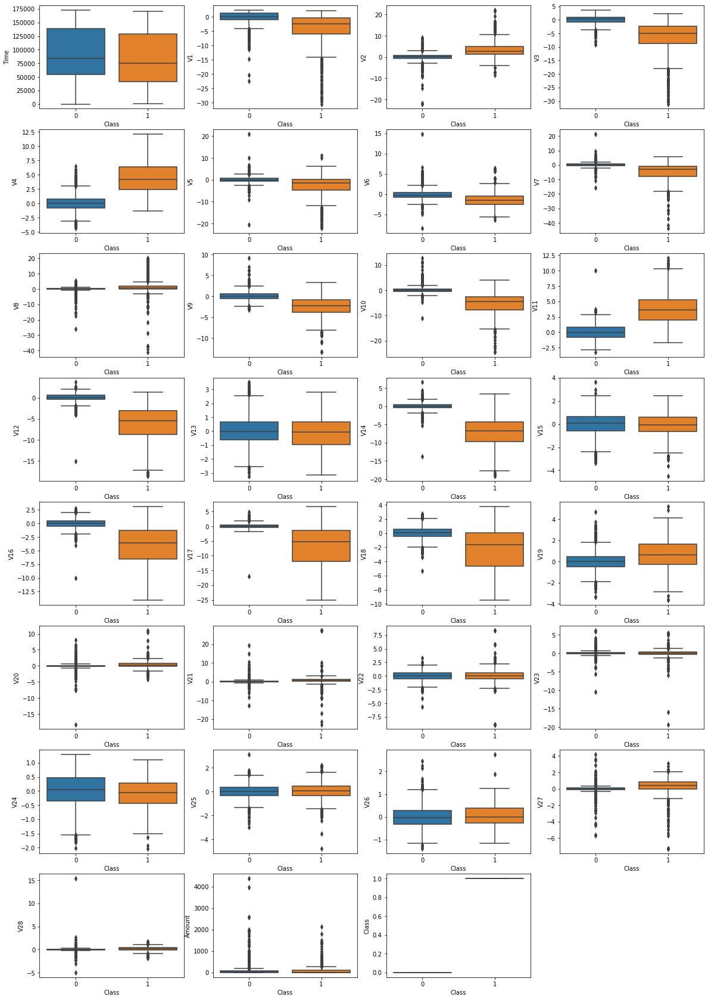

In [12]:
plt.figure(figsize=(20,30))
for i, column in enumerate(df_new.columns):
    plt.subplot(8,4,i+1)
    sns.boxplot(x='Class', y=column, data=df_new)
plt.show()

#### Statistical analysis to confirm if there is a significant difference in each feature between the normal and fraudulent transactions.

#### Since the features are all not normally distributed, I use Kruskal-Wallis test.

#### Ho: there is no significant difference**

#### Ha: there is significant difference**

In [13]:
for col in df_new.columns:
    print(col)
    print('Class 0 ---- Class 1 pvalue={}\n'.format(stats.kruskal(df_new[df_new['Class']==0][col], df_new[df_new['Class']==1][col])))

Time
Class 0 ---- Class 1 pvalue=KruskalResult(statistic=33.750135850828045, pvalue=6.266466754383424e-09)

V1
Class 0 ---- Class 1 pvalue=KruskalResult(statistic=448.2748224523064, pvalue=1.7122356523833373e-99)

V2
Class 0 ---- Class 1 pvalue=KruskalResult(statistic=643.6573772729035, pvalue=5.3520105938365684e-142)

V3
Class 0 ---- Class 1 pvalue=KruskalResult(statistic=868.1614638587529, pvalue=8.189821156518824e-191)

V4
Class 0 ---- Class 1 pvalue=KruskalResult(statistic=971.5553736546127, pvalue=2.7364757035455884e-213)

V5
Class 0 ---- Class 1 pvalue=KruskalResult(statistic=222.0858440350171, pvalue=3.1726148329023025e-50)

V6
Class 0 ---- Class 1 pvalue=KruskalResult(statistic=363.66875504631327, pvalue=4.4743935955685e-81)

V7
Class 0 ---- Class 1 pvalue=KruskalResult(statistic=570.7468823044135, pvalue=3.8623346019042895e-126)

V8
Class 0 ---- Class 1 pvalue=KruskalResult(statistic=125.83840387143506, pvalue=3.3356929381540993e-29)

V9
Class 0 ---- Class 1 pvalue=KruskalResu

#### Observation: Most of the features are significantly different. However, V13, V15, V22, and V26 are not significantly different between class 0 and 1 (pvalue>0.05). Let's consider 'Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10','V11', 'V12', 'V14', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V23', 'V24', 'V25', 'V27', 'V28', and 'Amount' for Credit Card Fraud Detection models.

In [14]:
X = df_new.drop(['V13','V15','V22','V26','Class'],axis=1)

In [15]:
# Standardize the data.
scaler = StandardScaler()
X_std = scaler.fit_transform(X)
y=df_new['Class']

## 2. Dimensionality reduction for visualizing the observations

### 2.1 PCA

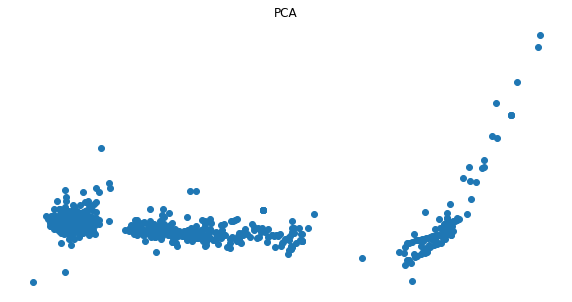

In [16]:
pca = PCA(n_components=2)

# Get the components by 
# calling `fit_transform()` method with the data
pca_components = pca.fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.title("PCA")
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### 2.2 t-SNE

C:\Users\iziam\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\iziam\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 3492 samples in 0.000s...
[t-SNE] Computed neighbors for 3492 samples in 0.404s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3492
[t-SNE] Computed conditional probabilities for sample 2000 / 3492
[t-SNE] Computed conditional probabilities for sample 3000 / 3492
[t-SNE] Computed conditional probabilities for sample 3492 / 3492
[t-SNE] Mean sigma: 0.663003
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.483971
[t-SNE] KL divergence after 300 iterations: 2.279697


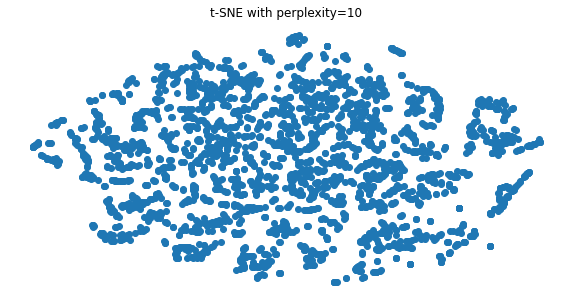

In [17]:
tsne = TSNE(n_components=2, verbose=1, perplexity=10, n_iter=300)
tsne_results = tsne.fit_transform(X_std)
plt.figure(figsize=(10,5))
plt.title("t-SNE with perplexity=10")
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3492 samples in 0.001s...


C:\Users\iziam\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\iziam\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 3492 samples in 0.532s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3492
[t-SNE] Computed conditional probabilities for sample 2000 / 3492
[t-SNE] Computed conditional probabilities for sample 3000 / 3492
[t-SNE] Computed conditional probabilities for sample 3492 / 3492
[t-SNE] Mean sigma: 0.924264
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.107315
[t-SNE] KL divergence after 300 iterations: 1.654889


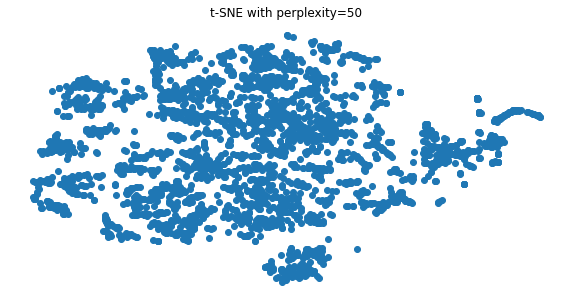

In [18]:
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=300)
tsne_results = tsne.fit_transform(X_std)
plt.figure(figsize=(10,5))
plt.title("t-SNE with perplexity=50")
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 3492 samples in 0.000s...


C:\Users\iziam\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\iziam\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 3492 samples in 0.451s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3492
[t-SNE] Computed conditional probabilities for sample 2000 / 3492
[t-SNE] Computed conditional probabilities for sample 3000 / 3492
[t-SNE] Computed conditional probabilities for sample 3492 / 3492
[t-SNE] Mean sigma: 1.036829
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.763664
[t-SNE] KL divergence after 300 iterations: 1.413694


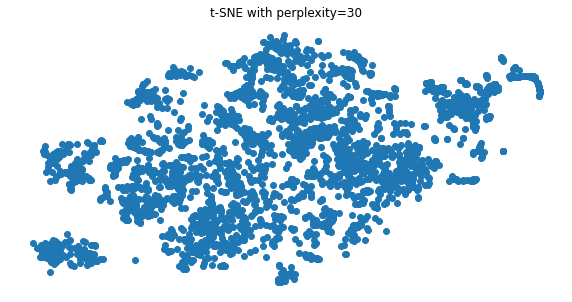

In [19]:
tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=300)
tsne_results = tsne.fit_transform(X_std)
plt.figure(figsize=(10,5))
plt.title("t-SNE with perplexity=30")
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### 2.3 UMAP

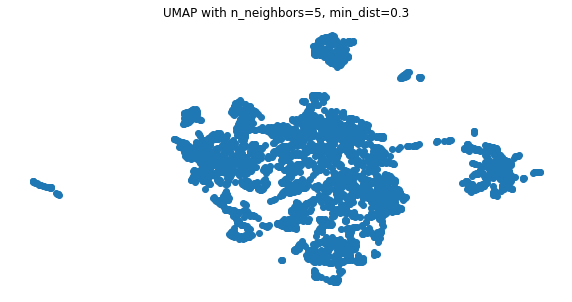

In [20]:
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)
plt.figure(figsize=(10,5))
plt.title("UMAP with n_neighbors=5, min_dist=0.3")
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

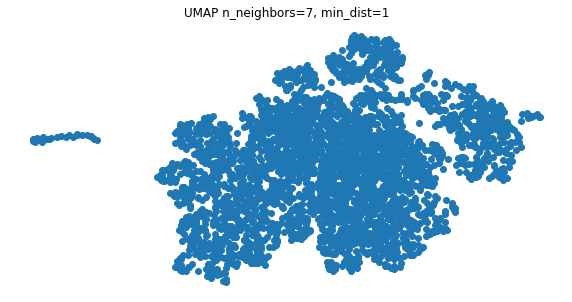

In [21]:
umap_results = umap.UMAP(n_neighbors=7,
                      min_dist=1,
                      metric='correlation').fit_transform(X_std)
plt.figure(figsize=(10,5))
plt.title("UMAP n_neighbors=7, min_dist=1")
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## 3. Unsupervised algorithms evaluation

### 3.1 K-Means

In [22]:
silh_score=[]

for cluster in range(2,5):
    km = KMeans(n_clusters=cluster, random_state=123).fit_predict(X_std)
    #silh_score.append(metrics.silhouette_score(X_std, km, metric='euclidean'))
    print('Cluster = {}, silhouette score is {}, ARI is {}'.format(cluster,metrics.silhouette_score(X_std, km, metric='euclidean'),metrics.adjusted_rand_score(y, km) ))

Cluster = 2, silhouette score is 0.6684500658509902, ARI is 0.47182136941024805
Cluster = 3, silhouette score is 0.46819364377018274, ARI is 0.8062637529837718
Cluster = 4, silhouette score is 0.47131021205417295, ARI is 0.8057142299755297


### Best K-Means based on silhouette score

In [23]:
km_best_sil= KMeans(n_clusters=2, random_state=123).fit_predict(X_std)
print('Cluster = 2, silhouette score is {}, ARI is {}'.format(metrics.silhouette_score(X_std, km_best_sil, metric='euclidean'),metrics.adjusted_rand_score(y, km_best_sil) ))

Cluster = 2, silhouette score is 0.6684500658509902, ARI is 0.47182136941024805


In [24]:
print('Comparing best K-Means clusters based on silhouette score against the data:')
print(pd.crosstab(km_best_sil, y))

Comparing best K-Means clusters based on silhouette score against the data:
Class     0    1
row_0           
0      2999  298
1         1  194


### Best K-Means based on ARI

In [25]:
km_best_ari = KMeans(n_clusters=3, random_state=123).fit_predict(X_std)
print('Cluster = 3, silhouette score is {}, ARI is {}'.format(metrics.silhouette_score(X_std, km_best_ari, metric='euclidean'),metrics.adjusted_rand_score(y, km_best_ari) ))

Cluster = 3, silhouette score is 0.46819364377018274, ARI is 0.8062637529837718


In [26]:
print('Comparing best K-Means clusters based on ARI against the data:')
print(pd.crosstab(km_best_ari, y))

Comparing best K-Means clusters based on ARI against the data:
Class     0    1
row_0           
0         0  274
1         1  107
2      2999  111


#### Observation: Best K-Means result is cluster=2 based on silhouette score at 0.668, and cluster=3 based on ARI at 0.806.

### 3.2 Agglomerative Clustering

In [27]:
print("silhouette score for linkeage='complete', affinity='cosine':\n")
for i in[2,3,4]:
    agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=i)
    # Fit model
    agg = agg_cluster.fit_predict(X_std)
    print('n_cluster = {}, silhouette score is {}, ARI is {}'.format(
        i,metrics.silhouette_score(X_std, agg, metric='euclidean'),metrics.adjusted_rand_score(y, agg) ))


silhouette score for linkeage='complete', affinity='cosine':

n_cluster = 2, silhouette score is 0.31224095764659476, ARI is 0.48091856370379693
n_cluster = 3, silhouette score is 0.0966064566451238, ARI is 0.539938639034651
n_cluster = 4, silhouette score is -0.024044816994511768, ARI is 0.32223699116073673


In [28]:
print("silhouette score for linkeage='average', affinity='cosine':\n")
for i in[2,3,4]:
    agg_cluster = AgglomerativeClustering(linkage='average', 
                                      affinity='cosine',
                                      n_clusters=i)
    # Fit model
    agg = agg_cluster.fit_predict(X_std)
    print('n_cluster = {}, silhouette score is {}, ARI is {}'.format(i,metrics.silhouette_score(X_std, agg, metric='euclidean'),metrics.adjusted_rand_score(y, agg) ))

silhouette score for linkeage='average', affinity='cosine':

n_cluster = 2, silhouette score is 0.5496622778340383, ARI is 0.8076952434928759
n_cluster = 3, silhouette score is 0.4923588287533809, ARI is 0.7897025266186426
n_cluster = 4, silhouette score is 0.07754041582680185, ARI is 0.25691742788180943


In [29]:
print("silhouette score for linkeage='ward', affinity='euclidean':\n")
for i in[2,3,4]:
    agg_cluster = AgglomerativeClustering(linkage='ward', 
                                      affinity='euclidean',
                                      n_clusters=i)
    # Fit model
    agg = agg_cluster.fit_predict(X_std)
    print('n_cluster = {}, silhouette score is {}, ARI is {}'.format(i,metrics.silhouette_score(X_std, agg, metric='euclidean'),metrics.adjusted_rand_score(y, agg) ))

silhouette score for linkeage='ward', affinity='euclidean':

n_cluster = 2, silhouette score is 0.7160361866961982, ARI is 0.27733409550068877
n_cluster = 3, silhouette score is 0.46009225426604045, ARI is 0.7951221615788054
n_cluster = 4, silhouette score is 0.4630824354848568, ARI is 0.7945479724408508


### Best Agglomerative Clustering based on silhouette score

In [30]:
agg_cluster_sil = AgglomerativeClustering(linkage='ward', 
                                      affinity='euclidean',
                                      n_clusters=2)
# Fit model
agg_best_sil = agg_cluster_sil.fit_predict(X_std)
print('When n_cluster = 2, Cluster is {}, silhouette score is {}, ARI is {}'.format(len(np.unique(agg_best_sil)), metrics.silhouette_score(X_std, agg_best_sil, metric='euclidean'),metrics.adjusted_rand_score(y, agg_best_sil) ))

When n_cluster = 2, Cluster is 2, silhouette score is 0.7160361866961982, ARI is 0.27733409550068877


In [31]:
print('Comparing best Agglomerative clusters based on silhouette score against the data:')
print(pd.crosstab(agg_best_sil, y))

Comparing best Agglomerative clusters based on silhouette score against the data:
Class     0    1
row_0           
0      2999  386
1         1  106


### Best Agglomerative Clustering based on ARI

In [32]:
agg_cluster_ari = AgglomerativeClustering(linkage='average', 
                                      affinity='cosine',
                                      n_clusters=2)
# Fit model
agg_best_ari = agg_cluster_ari.fit_predict(X_std)
print('n_cluster = 2, Cluster is {}, silhouette score is {}, ARI is {}'.format(len(np.unique(agg_best_ari)), metrics.silhouette_score(X_std, agg_best_ari, metric='euclidean'),metrics.adjusted_rand_score(y, agg_best_ari) ))

n_cluster = 2, Cluster is 2, silhouette score is 0.5496622778340383, ARI is 0.8076952434928759


In [33]:
print('Comparing best Agglomerative clusters based on ARI against the data:')
print(pd.crosstab(agg_best_ari, y))

Comparing best Agglomerative clusters based on ARI against the data:
Class     0    1
row_0           
0      2996  115
1         4  377


#### Observation: Best Agglomerative Clustering result is cluster=2 based on silhouette score at 0.716, and cluster=2 based on ARI at 0.808.

### 3.3 DBSCAN

In [34]:
# Defining the agglomerative clustering
for i in [1,2,3,4,5,6,7]:
    dbscan_cluster = DBSCAN(eps=i, min_samples=10)
    # Fit model
    dbs = dbscan_cluster.fit_predict(X_std)
    print('eps={}, silhouette score is {}, ARI is {}'.format(i,metrics.silhouette_score(X_std, dbs, metric='euclidean'),metrics.adjusted_rand_score(y, dbs) ))

eps=1, silhouette score is -0.32870621659026045, ARI is -0.12538483274995982
eps=2, silhouette score is 0.09063402832374833, ARI is 0.3202020035058412
eps=3, silhouette score is 0.44765026172939504, ARI is 0.533493107056488
eps=4, silhouette score is 0.6134046108118466, ARI is 0.38076329533706144
eps=5, silhouette score is 0.6562555523507176, ARI is 0.18975003524338396
eps=6, silhouette score is 0.6795313372094599, ARI is 0.16405958456704398
eps=7, silhouette score is 0.6703644068060632, ARI is 0.08704728962979895


In [35]:
# Defining the agglomerative clustering
for i in [2,4,8,20,50,60,80,100]:
    dbscan_cluster = DBSCAN(eps=6, min_samples=i)
    # Fit model
    dbs = dbscan_cluster.fit_predict(X_std)
    print('min_samples={}, silhouette score is {}, ARI is {}'.format(i,metrics.silhouette_score(X_std, dbs, metric='euclidean'),metrics.adjusted_rand_score(y, dbs) ))

min_samples=2, silhouette score is 0.5592102656312976, ARI is 0.14623318153349174
min_samples=4, silhouette score is 0.6810297483410376, ARI is 0.14617539616089728
min_samples=8, silhouette score is 0.6788418829379711, ARI is 0.15547827499959802
min_samples=20, silhouette score is 0.6919049175355736, ARI is 0.16930461934921817
min_samples=50, silhouette score is 0.7061460541649377, ARI is 0.30342877224755294
min_samples=60, silhouette score is 0.7041487064879745, ARI is 0.3078783771091108
min_samples=80, silhouette score is 0.7041487064879745, ARI is 0.3078783771091108
min_samples=100, silhouette score is 0.7032382112787362, ARI is 0.3060638543350116


In [36]:
# Defining the agglomerative clustering
for i in [2,4,8,20,50,60,80,100]:
    dbscan_cluster = DBSCAN(eps=3, min_samples=i)
    # Fit model
    dbs = dbscan_cluster.fit_predict(X_std)
    print('min_samples={}, silhouette score is {}, ARI is {}'.format(i,metrics.silhouette_score(X_std, dbs, metric='euclidean'),metrics.adjusted_rand_score(y, dbs) ))

min_samples=2, silhouette score is 0.09103100241327766, ARI is 0.4648247069490368
min_samples=4, silhouette score is 0.360783181470726, ARI is 0.46207681951378915
min_samples=8, silhouette score is 0.451071820260633, ARI is 0.5357076325822154
min_samples=20, silhouette score is 0.5370855564271019, ARI is 0.5695275702751277
min_samples=50, silhouette score is 0.5011660240355017, ARI is 0.6820798032880482
min_samples=60, silhouette score is 0.500311354143524, ARI is 0.6824108351864915
min_samples=80, silhouette score is 0.49544095083832757, ARI is 0.6725939936189202
min_samples=100, silhouette score is 0.4936724376692802, ARI is 0.6681328026969455


### Best DBSCAN based on silhouette score

In [37]:
dbscan_cluster_sil = DBSCAN(eps=6, min_samples=50)
# Fit model
dbs_best_sil = dbscan_cluster_sil.fit_predict(X_std)
print('Based on silhouette score, Cluster is {}, Best silhouette score is {}, ARI is {}'.format(len(np.unique(dbs_best_sil)),metrics.silhouette_score(X_std, dbs_best_sil, metric='euclidean'),metrics.adjusted_rand_score(y, dbs_best_sil) ))

Based on silhouette score, Cluster is 2, Best silhouette score is 0.7061460541649377, ARI is 0.30342877224755294


In [38]:
print('Comparing best DBSCAN clusters based on silhouette score against the data:')
print(pd.crosstab(dbs_best_sil, y))

Comparing best DBSCAN clusters based on silhouette score against the data:
Class     0    1
row_0           
-1       23  126
 0     2977  366


### Best DBSCAN based on ARI

In [39]:
dbscan_cluster_ari = DBSCAN(eps=3, min_samples=60)
# Fit model
dbs_best_ari = dbscan_cluster_ari.fit_predict(X_std)
print('Based on ARI, Cluster is {}, Best silhouette score is {}, ARI is {}'.format(len(np.unique(dbs_best_ari)),metrics.silhouette_score(X_std, dbs_best_ari, metric='euclidean'),metrics.adjusted_rand_score(y, dbs_best_ari) ))

Based on ARI, Cluster is 2, Best silhouette score is 0.500311354143524, ARI is 0.6824108351864915


In [40]:
print('Comparing best DBSCAN clusters based on ARI against the data:')
print(pd.crosstab(dbs_best_ari, y))

Comparing best DBSCAN clusters based on ARI against the data:
Class     0    1
row_0           
-1      152  417
 0     2848   75


#### Observation: Best DBSCAN result is cluster=2 based on silhouette score at 0.706, and cluster=2 based on ARI at 0.682. DBSCAN labled deviations as '-1', so it can not cluster frauds.

### 3.4 GMM (Gaussian mixture)

In [41]:
# Defining the agglomerative clustering
cov_list=['full','tied','diag','spherical']
for i in cov_list:
    gmm_cluster = GaussianMixture(n_components=2, random_state=123, covariance_type=i)
    # Fit model
    gmm = gmm_cluster.fit_predict(X_std)
    print('For covariance_type = {}, silhouette score is {}, ARI is {}'.format(i,metrics.silhouette_score(X_std, gmm, metric='euclidean'),metrics.adjusted_rand_score(y, gmm) ))

For covariance_type = full, silhouette score is 0.2610093388158032, ARI is 0.3023306181114223
For covariance_type = tied, silhouette score is 0.682598154903083, ARI is 0.42346720076995636
For covariance_type = diag, silhouette score is 0.46846874164287094, ARI is 0.6390916741359747
For covariance_type = spherical, silhouette score is 0.5295961398246715, ARI is 0.6478461346710277


In [42]:
# Defining the agglomerative clustering
n_list=[2,3,4,5,6,10]
for i in n_list:
    gmm_cluster = GaussianMixture(n_components=i, random_state=123, covariance_type='tied')
    # Fit model
    gmm = gmm_cluster.fit_predict(X_std)
    print('For n_components = {}, silhouette score is {}, ARI is {}'.format(i,metrics.silhouette_score(X_std, gmm, metric='euclidean'),metrics.adjusted_rand_score(y, gmm) ))

For n_components = 2, silhouette score is 0.682598154903083, ARI is 0.42346720076995636
For n_components = 3, silhouette score is 0.15836229936030985, ARI is 0.2638386534525144
For n_components = 4, silhouette score is 0.12313702529844292, ARI is 0.08463874582334754
For n_components = 5, silhouette score is 0.12692657078635905, ARI is 0.09414818830796712
For n_components = 6, silhouette score is 0.1352214578572244, ARI is 0.2142576536717063
For n_components = 10, silhouette score is 0.13767696870490104, ARI is 0.18560065989385552


In [43]:
# Defining the agglomerative clustering
n_list=[2,3,4,5,6,10]
for i in n_list:
    gmm_cluster = GaussianMixture(n_components=i, random_state=123, covariance_type='diag')
    # Fit model
    gmm = gmm_cluster.fit_predict(X_std)
    print('For n_components = {}, silhouette score is {}, ARI is {}'.format(i,metrics.silhouette_score(X_std, gmm, metric='euclidean'),metrics.adjusted_rand_score(y, gmm) ))

For n_components = 2, silhouette score is 0.46846874164287094, ARI is 0.6390916741359747
For n_components = 3, silhouette score is 0.0808203597174866, ARI is 0.2961809695479732
For n_components = 4, silhouette score is -0.0017818847211006883, ARI is 0.170230423122578
For n_components = 5, silhouette score is 0.001322732332436587, ARI is 0.16526784176691245
For n_components = 6, silhouette score is 0.010820192928819925, ARI is 0.1554563835092173
For n_components = 10, silhouette score is 0.03857225350853826, ARI is 0.14285296766104968


### Best GMM based on silhouette score

In [44]:
gmm_cluster_sil = GaussianMixture(n_components=2, random_state=123, covariance_type='tied')
# Fit model
gmm_best_sil = gmm_cluster_sil.fit_predict(X_std)
print("For n_components = 2, covariance_type='tied', Number of clusters is {}, silhouette score is {}, ARI is {}".format(len(np.unique(gmm_best_sil)),metrics.silhouette_score(X_std, gmm_best_sil, metric='euclidean'),metrics.adjusted_rand_score(y, gmm_best_sil) ))

For n_components = 2, covariance_type='tied', Number of clusters is 2, silhouette score is 0.682598154903083, ARI is 0.42346720076995636


In [45]:
print('Comparing best GMM clusters based on silhouette score against the data:')
print(pd.crosstab(gmm_best_sil, y))

Comparing best GMM clusters based on silhouette score against the data:
Class     0    1
row_0           
0      2999  321
1         1  171


### Best GMM based on ARI

In [46]:
gmm_cluster_ari = GaussianMixture(n_components=2, random_state=123, covariance_type='diag')
# Fit model
gmm_best_ari = gmm_cluster_ari.fit_predict(X_std)
print("For n_components = 2, covariance_type='diag', Number of clusters is {}, silhouette score is {}, ARI is {}".format(len(np.unique(gmm_best_ari)),metrics.silhouette_score(X_std, gmm_best_ari, metric='euclidean'),metrics.adjusted_rand_score(y, gmm_best_ari) ))

For n_components = 2, covariance_type='diag', Number of clusters is 2, silhouette score is 0.46846874164287094, ARI is 0.6390916741359747


In [47]:
print('Comparing best GMM clusters based on ari against the data:')
print(pd.crosstab(gmm_best_ari, y))

Comparing best GMM clusters based on ari against the data:
Class     0    1
row_0           
0      2794   64
1       206  428


#### Observation: Best GMM result is cluster=2 based on silhouette score at 0.683, and cluster=2 based on ARI at 0.639.

### Silhouette score and ARI comparison

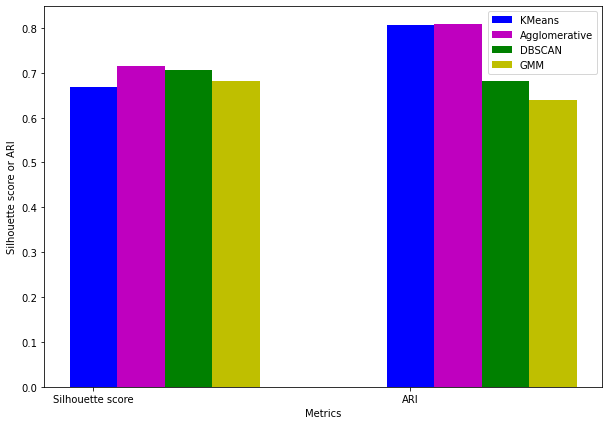

In [48]:
### Silhouette score and ARI comparison

metrics_df = pd.DataFrame(index=['Silhouette score', 'ARI'], columns=['KMeans', 'Agglomerative', 'DBSCAN', 'GMM'])
metrics_df['KMeans'] = [0.66845006585099,0.806263752983771]
metrics_df['Agglomerative'] = [0.716036186696198,0.807695243492875]
metrics_df['DBSCAN'] = [0.706146054164937,0.682410835186491]
metrics_df['GMM'] = [0.682598154903083,0.639091674135974]

plt.figure(figsize=(10,7))
X_ind = np.arange(metrics_df.shape[0])
index_list = ['Silhouette score', 'ARI']
plt.bar(X_ind, metrics_df['KMeans'], color='b', width=0.15)
plt.bar(X_ind+0.15, metrics_df['Agglomerative'], color='m', width=0.15)
plt.bar(X_ind+0.3, metrics_df['DBSCAN'], color='g', width=0.15)
plt.bar(X_ind+0.45, metrics_df['GMM'], color='y', width=0.15)
plt.xticks(X_ind, index_list)
plt.xlabel('Metrics')
plt.ylabel('Silhouette score or ARI')
plt.legend(labels=['KMeans', 'Agglomerative', 'DBSCAN', 'GMM'])
plt.show()

#### Summary: Considering results from above models, based on silhouette score: agg_best_sil is the best; based on ARI, agg_best_ari is the best.

## 4. Clustering by apply dimension reduction to the best clustering results

### 4.1 pca----Agglomerative Clustering based on silhouette score

In [49]:
pca_components = PCA(n_components=2).fit_transform(X_std)

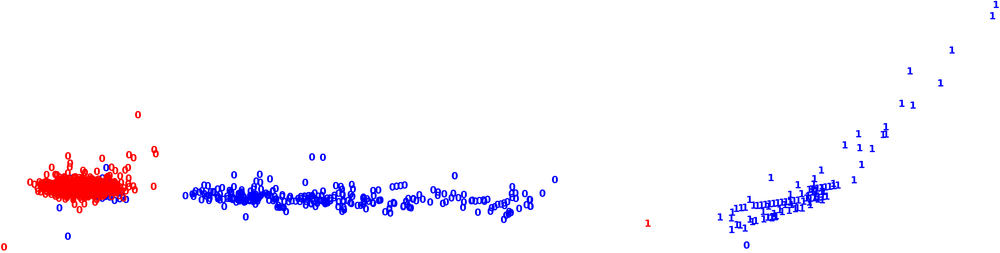

In [50]:
colours = 'rb'
plt.figure(figsize=(10,1.5))
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(agg_best_sil[i]),
             color=colours[y.values[i]],
             fontdict={'weight': 'bold', 'size': 120}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


### 4.2 pca----Agglomerative Clustering based on ARI

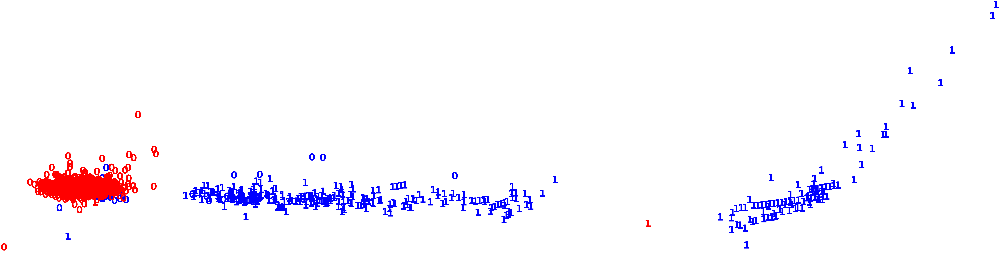

In [51]:
colours = 'rb'
plt.figure(figsize=(10,1.5))
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(agg_best_ari[i]),
             color=colours[y.values[i]],
             fontdict={'weight': 'bold', 'size': 120}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### 4.3 t-SNE----Agglomerative Clustering based on silhouette score

In [52]:
tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

C:\Users\iziam\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\iziam\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 3492 samples in 0.001s...
[t-SNE] Computed neighbors for 3492 samples in 0.419s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3492
[t-SNE] Computed conditional probabilities for sample 2000 / 3492
[t-SNE] Computed conditional probabilities for sample 3000 / 3492
[t-SNE] Computed conditional probabilities for sample 3492 / 3492
[t-SNE] Mean sigma: 1.036829
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.766953
[t-SNE] KL divergence after 300 iterations: 1.418888


In [53]:
colours = 'rb'
plt.figure(figsize=(10,3))
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(agg_best_sil[i]),
             color=colours[y.values[i]],
             fontdict={'weight': 'bold', 'size': 120}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


### 4.4 t-SNE----Agglomerative Clustering based on ARI

In [54]:
colours = 'rb'
plt.figure(figsize=(10,3))
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(agg_best_ari[i]),
             color=colours[y.values[i]],
             fontdict={'weight': 'bold', 'size': 120}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### 4.5 umap---Agglomerative Clustering based on silhouette score

In [55]:
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)


In [56]:
colours = 'rb'
plt.figure(figsize=(10,3))
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(agg_best_sil[i]),
             color=colours[y.values[i]],
             fontdict={'weight': 'bold', 'size': 100}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### 4.6 umap---Agglomerative Clustering based on ARI

In [57]:
colours = 'rb'
plt.figure(figsize=(10,3))
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(agg_best_ari[i]),
             color=colours[y.values[i]],
             fontdict={'weight': 'bold', 'size': 100}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

#### Observation: Agglomerative clustering based on ARI shows best prediction close to ground truth.

## 5. Results and discussion
As we can see, agglomerative clustering is better than K-Means, DBSCAN, and Gaussian mixture models according to values of silhouette score or ARI. ARI is better than Silhouette score for evaluating the clustering models for this problem. Agglomerative clustering based on ARI shows best prediction close to ground truth.For identifying as many fraudulent transactions as possible, Gaussian mixture is the best algorithsm based on Recall value. 